In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as sts
from config import *
from road_system_params import *
from collections import defaultdict

In [2]:
with open("data/nodes", "rb") as fp:  #Unpickling
    nodes = pickle.load(fp)
with open("data/edges", "rb") as fp:  #Unpickling
    edges = pickle.load(fp)
with open("data/traffic_network", "rb") as fp:  #Unpickling
    G = pickle.load(fp)
with open("data/relative_arrival_rates", "rb") as fp: #Unpcikling
    relative_arrival_rates = pickle.load(fp)

In [3]:
with open("data/optimal_network_flow", "rb") as fp:   #Unpickling
    netflow_values,results, conf_int, simulated_density,simualted_density_conf_int,road_wise_data = pickle.load(fp)

In [4]:
from matplotlib import cm, colors
def create_summary_plot(speed_index, var_of_interest, colormap = cm.RdYlGn,vmin = "default", vmax = "default", data = road_wise_data, edges = edges ):
    nodes["type"] = nodes["type"].astype("category")
    
    summary_statistics = pd.concat(road_wise_data[speed_index]).astype({"Road_ID":np.int64}).groupby("Road_ID").mean()
    edges_empirical = summary_statistics.merge(edges.loc[:,["Edge_ID","start_x", "start_y", "end_x", "end_y"]],
                             left_on = "Road_ID", right_on = "Edge_ID" )
    #Preview Graph system, and Label Edges and Nodes for referencing

    import matplotlib.pyplot as plt
    from matplotlib import cm, colors
    fig, ax = plt.subplots(figsize=(8, 5))
    my_cmap = colormap
    if vmax =="default":
        vmax = edges_empirical[var_of_interest].max()
    if vmin == "default":
        vmin == edges_empirical[var_of_interest].min()
    my_norm = colors.Normalize(vmin=vmin, vmax= vmax)


    for i,row in enumerate(edges_empirical.iterrows()):
        row = row[1]
        ax.plot([row["start_x"],row["end_x"]],[row["start_y"],row["end_y"]], 
                 color = my_cmap(my_norm(edges_empirical[var_of_interest][i])), linewidth = 5)
        ax.text((row["start_x"]+row["end_x"])/2 + 5,(row["start_y"]+row["end_y"])/2 + 8 , f"E-{i}", fontstyle = "italic")
    node_col = {'inflow':'Blue', 'outflow':'Red', 'intersection': 'Green'}
    ax.scatter(nodes["x"] ,nodes["y"] , s = 30, c = nodes["type"].map(node_col), zorder = 3)
    fig.colorbar(cm.ScalarMappable(norm=my_norm, cmap=my_cmap), orientation="vertical", label=var_of_interest)
    for row in nodes.iterrows():
        row = row[1]
        plt.text(row[0]+5, row[1]+5, f"N-{row[3]}", fontweight = "bold")
    ax.set_title(f"Traffic Heat Map with Inflow rate {netflow_values[speed_index]:.2f} cars/s ")
    ax.axes.tick_params(axis='both', which='both', reset = True,  bottom='off', top='off', labelbottom='off', right='off',
                              left='off',
                              labelleft='off')
    ax.axes.xaxis.set_visible(False)
    ax.axes.yaxis.set_visible(False)
    return fig


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

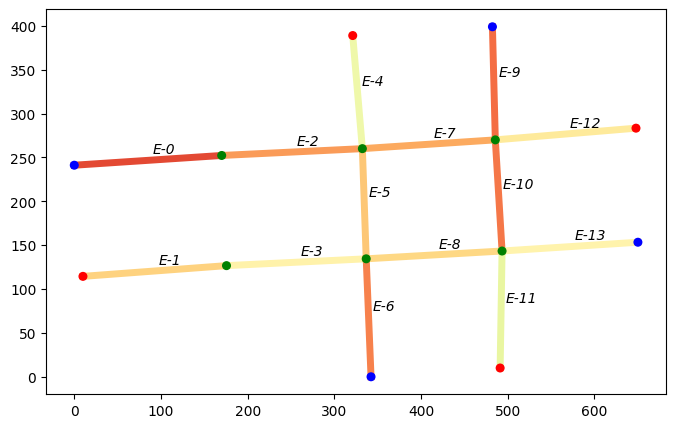

In [6]:
out = create_summary_plot(speed_index = np.argmin(results), var_of_interest = "harmonicAverageSpeed",colormap  = cm.RdYlGn,vmin = 0, vmax = 30)

ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

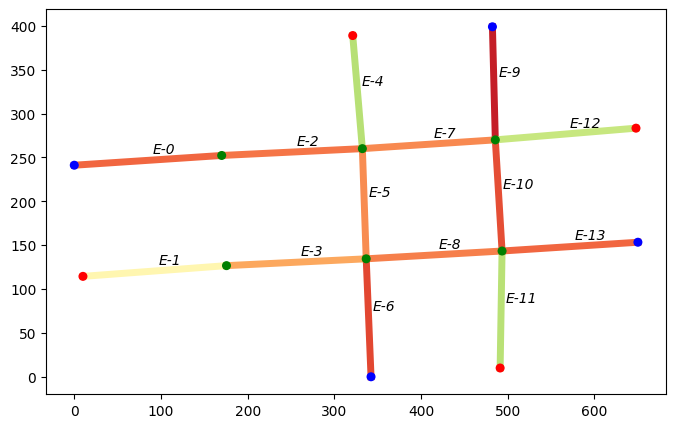

In [8]:
out = create_summary_plot(speed_index = 31,var_of_interest= "averageSpeed",colormap =   cm.RdYlGn, vmin = 0, vmax = 30)

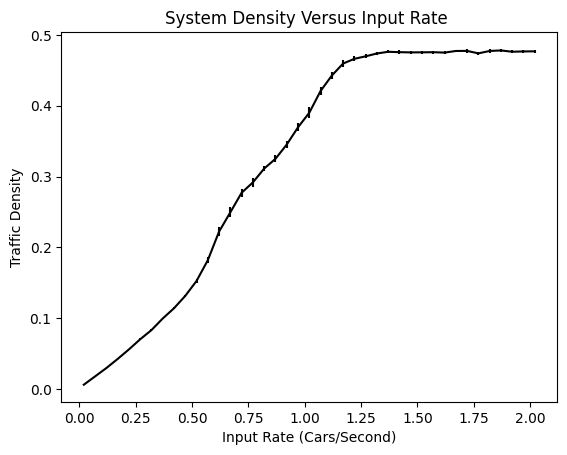

In [9]:

plt.errorbar(netflow_values,simulated_density,simualted_density_conf_int, color = "black")
plt.title("System Density Versus Input Rate ")
plt.xlabel("Input Rate (Cars/Second)")
plt.ylabel("Traffic Density")
plt.show()


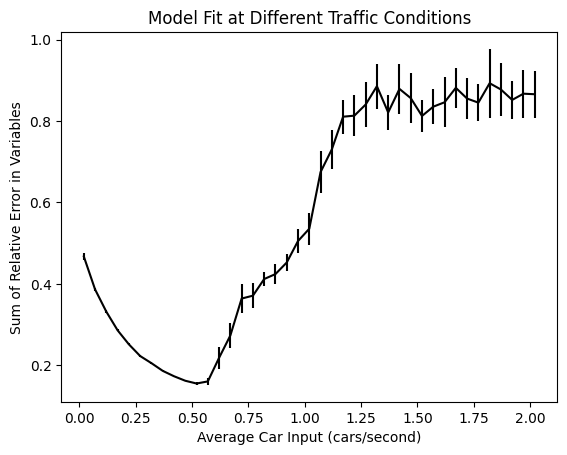

In [10]:
plt.errorbar(netflow_values,results,conf_int, color = "black")
plt.title("Model Fit at Different Traffic Conditions")
plt.xlabel("Average Car Input (cars/second)")
plt.ylabel("Sum of Relative Error in Variables")

plt.show()



In [11]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import matplotlib.animation as anim
import numpy as np
from IPython.display import HTML
from tqdm import tqdm
def make_animation(sim, total_frames, steps_per_frame=1, interval=100, title = ''):
    def update(frame_number):
        for _ in range(steps_per_frame):
            sim.update()
        progress_bar.update(1)
        return [sim.draw(title)]

    progress_bar = tqdm(total=total_frames)
    animation = FuncAnimation(
        sim.figure, update, init_func=lambda: [], frames=total_frames, interval=interval)
    output = HTML(animation.to_html5_video())
    sim.figure.clf()
    return output


In [12]:
best_fit_inflow = netflow_values[np.argmin(np.array(results) )]
sim = TrafficSystemParameterised()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = best_fit_inflow)
cycle_offsets  = {
    8: 0,
    5: 0,
    6: 18,
    4: 18,
}
for node, offset in cycle_offsets.items():
    sim.traffic_grid.nodes[node]["node"].counter += offset
plt.close()
make_animation(sim, total_frames=1500, steps_per_frame=1, title = "Traffic Sim")

  0%|          | 0/1500 [00:00<?, ?it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_system_params.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
/Users/gordonma/PycharmProjects/pythonProject1/road_system_params.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
  0%|          | 3/1500 [00:00<01:05, 22.71it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_system_params.py:113: FutureWarning: Series.__getitem__ treating keys as positions is de

In [13]:
def process_car_speeds(netflow_rate, start_data_collect, end_trial,traffic_model = TrafficSystemParameterised):
    
    sim = traffic_model()
    sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate)
    plt.close()
    for __ in tqdm(range(end_trial)):
        sim.update()
    cars = []
    for outflow in sim.outflows:
        for car in outflow.pool:
            if car.exitTime > start_data_collect:
                cars.append(car)
    avg_speeds = defaultdict(list)
    dist_travelled = defaultdict(list)
    for car in cars:
        avg_speeds[tuple(car.path)].append(( (car.distanceTravelled *cell_size )/ (car.exitTime - car.entranceTime)) / kmh_to_ms_conversion)
        dist_travelled[tuple(car.path)].append( (car.distanceTravelled *cell_size ))
    output_data = []
    for key in avg_speeds.keys():
        start_node, end_node = key[0], key[-1]
        data = avg_speeds[key]
        mean_speed = np.mean(data)
        mean_speed_error = sts.sem(data) * 1.96
        std = np.std(data)
        travel_dist = np.mean(dist_travelled[key])
        output_data.append([start_node, end_node, mean_speed, mean_speed_error, std, travel_dist, len(data)])
    df = pd.DataFrame(output_data, columns = ["start", "end", "mean_speed", "mean_speed_error", "speed_stdev", "path_length", "sample_size" ])
    return(df)

In [15]:
df = process_car_speeds(best_fit_inflow,1800, 12600,TrafficSystemParameterised  )

100%|██████████| 12600/12600 [00:36<00:00, 347.77it/s]


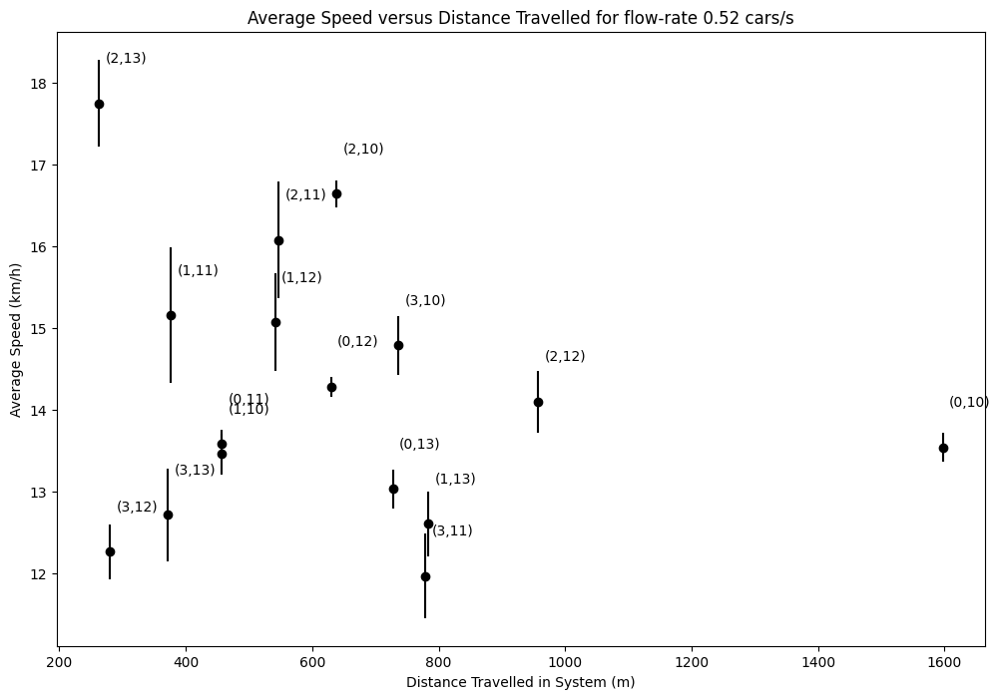

In [17]:
plt.figure(figsize = (12,8))
plt.errorbar("path_length", "mean_speed", "mean_speed_error",fmt='o', data = df, color = "black")
for row in df.iterrows():
    row = row[1]
    plt.text(row["path_length"] + 10, row["mean_speed"] + 0.5, 
             s = f"({int(row['start'])},{int(row['end'])})")
plt.xlabel("Distance Travelled in System (m)")
plt.ylabel("Average Speed (km/h)")
plt.title(f"Average Speed versus Distance Travelled for flow-rate {best_fit_inflow:.2f} cars/s")
plt.show()

In [18]:
df2 = process_car_speeds(1.2,1800, 12600,TrafficSystemParameterised)


100%|██████████| 12600/12600 [00:53<00:00, 236.27it/s]


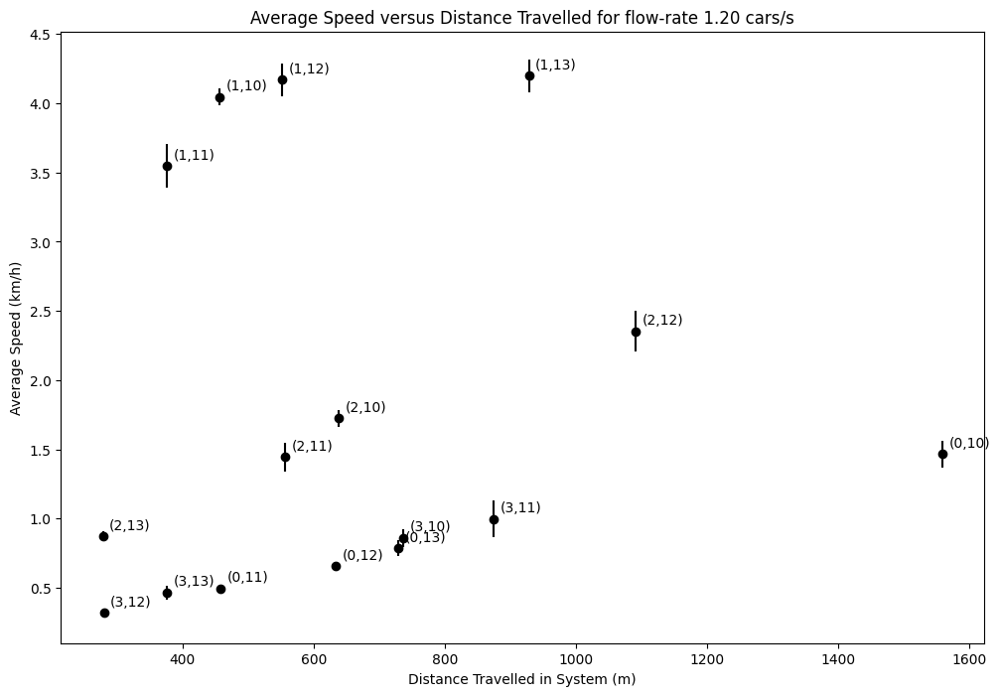

In [19]:
plt.figure(figsize = (12,8))
plt.errorbar("path_length", "mean_speed", "mean_speed_error",label = "hi", fmt='o', data = df2, color = "black")
for row in df2.iterrows():
    row = row[1]
    plt.text(row["path_length"] + 10, row["mean_speed"]+ 0.05 , 
             s = f"({int(row['start'])},{int(row['end'])})")
plt.xlabel("Distance Travelled in System (m)")
plt.ylabel("Average Speed (km/h)")
plt.title(f"Average Speed versus Distance Travelled for flow-rate {1.2:.2f} cars/s")
plt.show()

In [20]:
sim = TrafficSystemParameterised()
out = sim.build_network(edges, nodes, relative_arrival_rates, netflow_rate = 3)
plt.close()
make_animation(sim, total_frames=1500, steps_per_frame=1, title = "Traffic Sim Stress Test")

  0%|          | 0/1500 [00:00<?, ?it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_system_params.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
  0%|          | 2/1500 [00:01<21:31,  1.16it/s]/Users/gordonma/PycharmProjects/pythonProject1/road_system_params.py:113: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.axes.plot([row[0], row[2]], [row[1], row[3]], color="black", zorder = 1)
/Users/gordonma/PycharmProjects/pythonProject1/road_system_params.py:113: FutureWarning: Series.__getitem__ treating keys as positions is de